In [3]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from sklearn import linear_model
import matplotlib.animation as animation
from IPython.display import HTML

GRADIENT DESCENT

In [4]:
#vd f(x)=x^2+5sin(x)
def grad(x):
    return 2*x+5*np.cos(x)
def cost(x):
    return x**2+5*np.sin(x)
def GD(x0,eta):
    x=[x0]
    for it in range(10000):
        x_new=x[-1]-eta*grad(x[-1])
        if(abs(grad(x_new))<1e-5):
            break
        x.append(x_new)
    return (x,it)

In [5]:
x1,it1=GD(-5,0.1)
print('x= {}, iteration= {}, cost= {}, grad= {}'.format(x1[-1],it1,cost(x1[-1]),grad(x1[-1])))
x2,it2=GD(5,0.1)
print('x= {}, iteration= {}, cost= {}, grad= {}'.format(x2[-1],it2,cost(x2[-1]),grad(x2[-1])))

x= -1.1105129029355332, iteration= 15, cost= -3.2463942726728883, grad= -1.5546930124621383e-05
x= -1.1105079007592145, iteration= 33, cost= -3.2463942726695914, grad= 1.686530973632472e-05


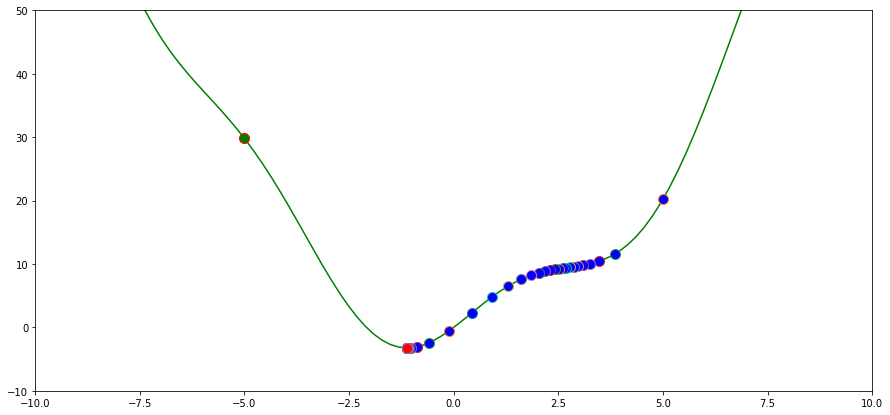

In [6]:
fig1=plt.figure(figsize=(15,7))
ax=plt.axes(xlim=(-10,10),ylim=(-10,50))
x = np.linspace(-10, 10, 100)
plt.plot(x, cost(x), color='green')
x=[-5]
y=[cost(-5)]
plt.plot(x, y, marker="o", markersize=10, markeredgecolor="red", markerfacecolor="green")
x1,it1=GD(5,0.1)
x1=np.array(x1)
y1=cost(x1)
for i in range(it1):
    plt.plot(x1[i], y1[i], marker="o", markersize=10, markerfacecolor="blue")

graph, = plt.plot([], [], marker='o',markersize=10,markerfacecolor="red")
def animate(i):
    graph.set_data(x1[i], y1[i])
    return graph
ani = animation.FuncAnimation(fig1, animate, frames=it1, interval=200)
HTML(ani.to_jshtml())

GRADIENT DESCENT VỚI MOMENTUM

In [7]:
#vd f(x)=x^2+10sin(x)
def grad(x):
    return 2*x+10*np.cos(x)
def cost(x):
    return x**2+10*np.sin(x)
def GD(x0,eta):
    x=[x0]
    for it in range(10000):
        x_new=x[-1]-eta*grad(x[-1])
        if(abs(grad(x_new))<1e-3):
            break
        x.append(x_new)
    return (x,it)

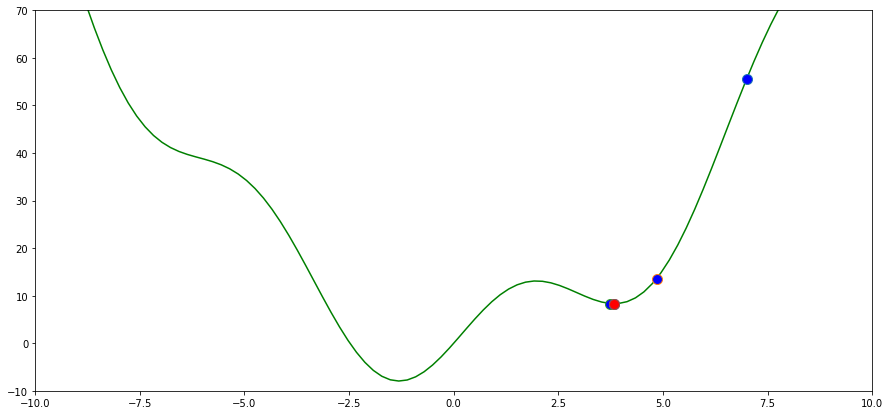

In [8]:
#ko co momenttum
fig1=plt.figure(figsize=(15,7))
ax=plt.axes(xlim=(-10,10),ylim=(-10,70))
x = np.linspace(-10, 10, 100)
plt.plot(x, cost(x), color='green')
x1,it1=GD(7,0.1)
x1=np.array(x1)
y1=cost(x1)
for i in range(it1):
    plt.plot(x1[i], y1[i], marker="o", markersize=10, markerfacecolor="blue")

graph, = plt.plot([], [], marker='o',markersize=10,markerfacecolor="red")
def animate(i):
    graph.set_data(x1[i], y1[i])
    return graph
ani = animation.FuncAnimation(fig1, animate, frames=it1, interval=200)
HTML(ani.to_jshtml())

In [9]:
#co momentum
def GD_momentum(gra, theta_init, eta, gamma):
# Suppose we want to store history of theta
    theta = [theta_init]
    v_old = np.zeros_like(theta_init)
    for it in range(1000):
        v_new = gamma*v_old + eta*grad(theta[-1])
        theta_new = theta[-1] - v_new
        if np.linalg.norm(grad(theta_new))/np.array(theta_init).size < 1e-3:
            break
        theta.append(theta_new)
        v_old = v_new
    return theta

In [10]:
x1=GD_momentum(grad(7),7,0.1,0.9)
len(x1)

163

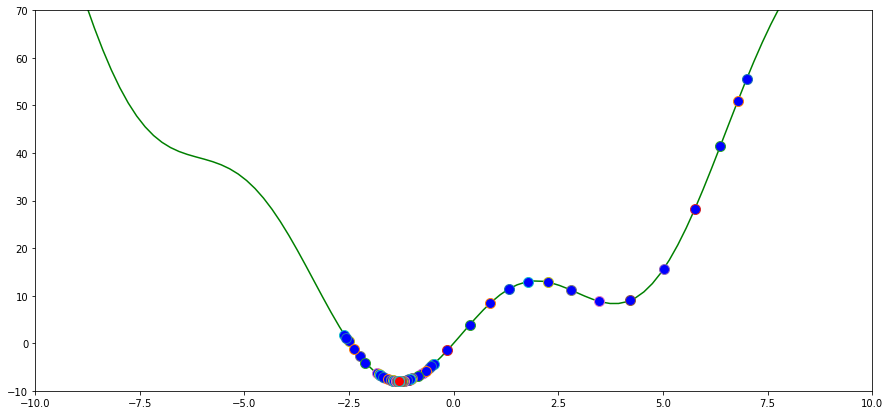

In [11]:
fig1=plt.figure(figsize=(15,7))
ax=plt.axes(xlim=(-10,10),ylim=(-10,70))
x = np.linspace(-10, 10, 100)
plt.plot(x, cost(x), color='green')
x1=GD_momentum(grad(7),7,0.01,0.9)
x1=np.array(x1)
y1=cost(x1)
for i in range(len(x1)):
    plt.plot(x1[i], y1[i], marker="o", markersize=10, markerfacecolor="blue")

graph, = plt.plot([], [], marker='o',markersize=10,markerfacecolor="red")
def animate(i):
    graph.set_data(x1[i], y1[i])
    return graph
ani = animation.FuncAnimation(fig1, animate, frames=len(x1), interval=200)
HTML(ani.to_jshtml())

SỬ DỤNG NESTEROV ACCELERATED GRADIENT giúp hội tụ nhanh hơn MOMENTUM

In [12]:
def GD_NAG(gra,theta_init,eta,gamma):
    theta=[theta_init]
    v=[np.zeros_like(theta_init)]
    for it in range(1000):
        v_new=gamma*v[-1]+eta*grad(theta[-1]-gamma*v[-1])
        theta_new=theta[-1]-v_new
        if np.linalg.norm(grad(theta_new))/np.array(theta_init).size<1e-3:
            break
        theta.append(theta_new)
        v.append(v_new)
    return theta

In [13]:
x1=GD_NAG(grad(7),7,0.1,0.9)
len(x1)

18

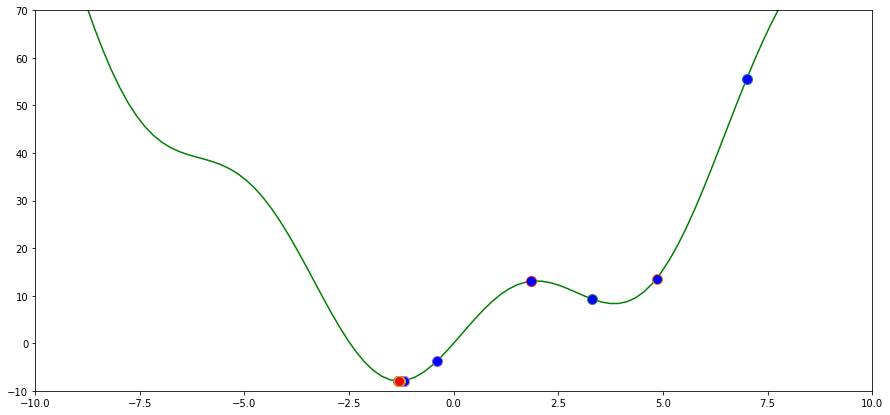

In [14]:
fig1=plt.figure(figsize=(15,7))
ax=plt.axes(xlim=(-10,10),ylim=(-10,70))
x = np.linspace(-10, 10, 100)
plt.plot(x, cost(x), color='green')
x1=GD_NAG(grad(7),7,0.1,0.9)
x1=np.array(x1)
y1=cost(x1)
for i in range(len(x1)):
    plt.plot(x1[i], y1[i], marker="o", markersize=10, markerfacecolor="blue")

graph, = plt.plot([], [], marker='o',markersize=10,markerfacecolor="red")
def animate(i):
    graph.set_data(x1[i], y1[i])
    return graph
ani = animation.FuncAnimation(fig1, animate, frames=len(x1), interval=200)
HTML(ani.to_jshtml())

NEWTON METHOD

In [63]:
def NewtonMethod(func,funcderiv,x,n):
    def f(x):
        f=eval(func)
        return f
    def df(x):
        df=eval(funcderiv)
        return df
    for inter in range(1,n):
        i=x-(f(x)/df(x))
        x=i
        if abs(f(i)) <1e-5 or f(x)==0:
            print(f'no= {x} after {inter} interations')
            print(f'value of f(x)= {f(x)}')

            

In [66]:
NewtonMethod('(1.0/4.0)*x**3+(3.0/4.0)*x**2-(3.0/2.0)*x-2','(3.0/4.0)*x**2+(6.0/4.0)*x-3/2',0,10)

no= -1.0000001387523911 after 3 interations
value of f(x)= 3.1219288043615734e-07
no= -0.9999999999999998 after 4 interations
value of f(x)= -6.661338147750939e-16
no= -1.0 after 5 interations
value of f(x)= 0.0
no= -1.0 after 6 interations
value of f(x)= 0.0
no= -1.0 after 7 interations
value of f(x)= 0.0
no= -1.0 after 8 interations
value of f(x)= 0.0
no= -1.0 after 9 interations
value of f(x)= 0.0
